For an audio file of a given bpm we split it into beats and classify them using k-means. Then we use the class sequence determined by the audio file to randomly select a beat of the corresponding class to generate a new audiom file.
For the feature extraction we will use pyAudioAnalysis by Theodoros Giannakopoulos (https://github.com/tyiannak/pyAudioAnalysis)

In [2]:
import numpy as np
from pyAudioAnalysis import audioFeatureExtraction
import matplotlib.pyplot as plt
import IPython
from scipy.io import wavfile as wav

In [3]:
#we set a filename to acces the wav file, in this case ww will use a drum pattern of 64 beats at 170 bpm 
#it is a mono file at a sample rate of 44100Hz and a bitrate of 16
filename='./data/DrumPattern.wav'
bpm=170

In [4]:
#we can play the file using IPython
IPython.display.Audio(filename)

In [5]:
#we extract the data from the file
srate, data_dr = wav.read(filename)
print("Sample rate: "+str(srate))
print("Shape of the data array: " +str(data_dr.shape))

Sample rate: 44100
Shape of the data array: (996142,)


So this file has a total of 996142 samples, which at 44100Hz it is a total of 22.58825396825397 seconds

In [6]:
#Using the data array we can play parts of the audio it represents.
#For example, this is the audio that corrensponds to the part between sample 10000 and 150000
IPython.display.Audio(data_dr[10000:150000] , rate=44100)

In [7]:
#number of beats, step (samples per beat)
def beatsinfo(bpm, samplerate, data):
    beats=bpm/60*(1/samplerate)*data.shape[0]
    numberofbeats=np.int(beats)
    step=np.int(data.shape[0]/beats)
    return numberofbeats,step

In [8]:
numberofbeats,step = beatsinfo(bpm, srate, data_dr)
print(numberofbeats)
print(step)

64
15564


In [9]:
#extract features and create a matrix with shape number of features x number of points
def extract_feature_matrix(data, step, samplerate, numberofbeats, frame_size=0.15):
    feat_0,_ = audioFeatureExtraction.stFeatureExtraction(data[:step], samplerate, frame_size*samplerate, frame_size*0.5*samplerate);
    X=feat_0.reshape(feat_0.shape[0]*feat_0.shape[1] ,1)
    for  n in range(1, numberofbeats):
        X_temp,_ = audioFeatureExtraction.stFeatureExtraction(data[n*step:(n+1)*step], samplerate, frame_size*samplerate, frame_size*0.5*samplerate)
        X=np.append(X,X_temp.reshape(102,1),axis=1)
    return X

In [10]:
#Let us extract the features of our data set
X=extract_feature_matrix(data_dr, step, srate, numberofbeats)
X.shape

(102, 64)

In [11]:
#Now we will apply kMeans to cluster X
from sklearn.cluster import KMeans

In [12]:
#KMeans with 3 classes
numberofclusters=3
kmeans = KMeans(numberofclusters)
kmeans.fit(X.T) #the intput to kMeans must be of shape number of points x number of features
kmeans.predict(X.T)
labels = kmeans.labels_

In [13]:
#this is the sequence of classes for our dataset X
labels

array([1, 0, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 2, 2, 1, 1, 0, 2, 2, 1, 2,
       1, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1,
       1, 2, 1, 1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 0, 1, 1, 1, 2, 1, 1])

We can plot this using matplotlib

In [14]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

Text(0.5, 0.92, 'K Means')

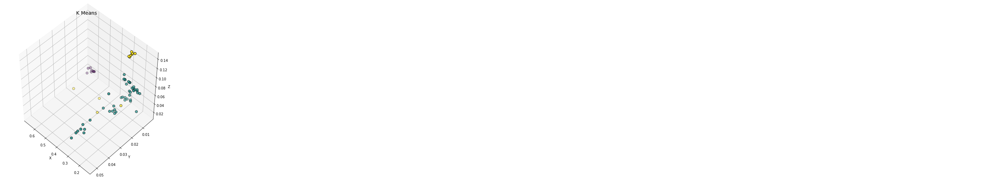

In [15]:
#Plotting the dataset with three clusters
fig = plt.figure(1, figsize=(7,7))
ax = Axes3D(fig, rect=[0, 0, 0.95, 1], elev=48, azim=134)
ax.scatter(X.T[:, 3], X.T[:, 0], X.T[:, 2],
          c=labels.astype(np.float), edgecolor="k", s=50)
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.title("K Means", fontsize=14)

Let's do the clustering with 5 clusters

In [16]:
numberofclusters=5
kmeans = KMeans(numberofclusters)
kmeans.fit(X.T) #the intput to kMeans must be of shape number of points x number of features
kmeans.predict(X.T)
labels = kmeans.labels_
labels

array([4, 2, 0, 0, 4, 3, 0, 4, 0, 2, 0, 0, 4, 1, 1, 4, 4, 2, 1, 1, 4, 3,
       0, 4, 0, 2, 0, 0, 4, 3, 4, 4, 4, 2, 4, 0, 4, 3, 0, 4, 4, 2, 0, 4,
       4, 3, 4, 4, 4, 2, 0, 0, 4, 3, 0, 4, 4, 2, 0, 0, 4, 3, 4, 4])

We create a dictionary for the 5 classes

In [17]:
#classses
classes={}
for i in range(numberofclusters):
    classes[str(i)] =np.flatnonzero(labels == i)

In [18]:
classes

{'0': array([ 2,  3,  6,  8, 10, 11, 22, 24, 26, 27, 35, 38, 42, 50, 51, 54, 58,
        59], dtype=int64),
 '1': array([13, 14, 18, 19], dtype=int64),
 '2': array([ 1,  9, 17, 25, 33, 41, 49, 57], dtype=int64),
 '3': array([ 5, 21, 29, 37, 45, 53, 61], dtype=int64),
 '4': array([ 0,  4,  7, 12, 15, 16, 20, 23, 28, 30, 31, 32, 34, 36, 39, 40, 43,
        44, 46, 47, 48, 52, 55, 56, 60, 62, 63], dtype=int64)}

Now we'll construct a sequence of 64 samples, the ith sample will be of the same class as the ith sample of X, but we will choose
randomnly between the samples of that class.

In [19]:
#choose randomly one sample of each classs with the original distribution
class_sequence=np.zeros(numberofbeats,dtype=int)
for i in range(len(labels)):
    a=np.random.choice(classes[str(labels[i])])
    class_sequence[i]=a

In [20]:
class_sequence

array([52, 33, 22, 51, 56, 37, 50, 40,  8, 41, 22, 11, 31, 13, 18, 62, 15,
       25, 18, 19, 43, 37, 10, 55,  2,  9, 11, 54, 47, 21, 40, 52, 12,  9,
       44, 24, 39, 21, 10, 62, 36,  1, 42, 40, 52, 29, 23, 63,  0, 57, 54,
       10, 39, 37, 50,  4, 30, 25,  6, 54, 12, 45, 30, 16])

In [21]:
#create new wav matrix with the class sequence
data_dr_new=np.zeros((numberofbeats*step,),dtype=np.int16)
for n in range(numberofbeats):
    data_dr_new[n*step:(n+1)*step]=data_dr[class_sequence[n]*step:(class_sequence[n]+1)*step]

In [22]:
data_dr_new.shape

(996096,)

In [23]:
#Let's play this sequence
IPython.display.Audio(data_dr_new, rate=44100)

We can use other wav files to "interpret" the class sequence defined by X.

In [24]:
#This new file, LPDrums, is still of 64 beats at 170 bpm 
#it is a mono file at a sample rate of 44100Hz and a bitrate of 16
filename='./data/LPDrums.wav'

In [25]:
IPython.display.Audio(filename)

In [26]:
#let's extract the data from the file
srate, data_LP = wav.read(filename)
print("Sample rate: "+str(srate))
print("Shape of the data array: " +str(data_LP.shape))

Sample rate: 44100
Shape of the data array: (996142,)


This file has the same number of beats and the same sample rate as the first one, so the step is the same.

Let's extract the features.

In [27]:
Y=extract_feature_matrix(data_LP, step, srate, numberofbeats)
Y.shape

(102, 64)

In [28]:
labels_LP=kmeans.predict(Y.T)
labels_LP

array([1, 4, 1, 4, 1, 4, 3, 0, 1, 4, 3, 3, 1, 4, 1, 4, 1, 4, 0, 3, 1, 4,
       3, 3, 1, 3, 1, 4, 1, 4, 3, 0, 1, 4, 3, 3, 4, 0, 1, 4, 1, 4, 3, 0,
       1, 4, 3, 3, 1, 4, 1, 4, 1, 3, 3, 0, 1, 4, 3, 3, 1, 4, 1, 4])

In [29]:
#classses dict for the new wav file
classes_LP={}
for i in range(numberofclusters):
    classes_LP[str(i)] =np.flatnonzero(labels_LP == i)
classes_LP

{'0': array([ 7, 18, 31, 37, 43, 55], dtype=int64),
 '1': array([ 0,  2,  4,  8, 12, 14, 16, 20, 24, 26, 28, 32, 38, 40, 44, 48, 50,
        52, 56, 60, 62], dtype=int64),
 '2': array([], dtype=int64),
 '3': array([ 6, 10, 11, 19, 22, 23, 25, 30, 34, 35, 42, 46, 47, 53, 54, 58, 59],
       dtype=int64),
 '4': array([ 1,  3,  5,  9, 13, 15, 17, 21, 27, 29, 33, 36, 39, 41, 45, 49, 51,
        57, 61, 63], dtype=int64)}

In [30]:
#choose randomly one sample of each classs with the original distribution
class_sequence_LP=np.zeros(numberofbeats,dtype=int)
for i in range(len(labels_LP)):
    a=np.random.choice(classes[str(labels_LP[i])])
    class_sequence_LP[i]=a
class_sequence_LP

array([19, 31, 19, 52, 19, 28, 61,  2, 13, 34,  5,  5, 13, 20, 13, 55, 13,
       39,  3, 53, 18, 47, 29, 45, 19, 37, 18, 62, 19, 20, 29, 22, 18, 36,
       21, 37,  4,  6, 19, 31, 13, 40, 21,  8, 19, 60, 29, 21, 19, 12, 13,
       31, 14, 45,  5, 27, 19, 47, 53, 21, 18, 60, 19, 32])

Now we create wav matrix with this new sequence

In [31]:
data_LP_new=np.zeros((numberofbeats*step,),dtype=np.int16)
for n in range(numberofbeats):
    data_LP_new[n*step:(n+1)*step]=data_dr[class_sequence_LP[n]*step:(class_sequence_LP[n]+1)*step]
data_LP_new.shape

(996096,)

In [32]:
#Let's play this sequence
IPython.display.Audio(data_LP_new, rate=44100)

We can export this data to an actual wav file.

In [33]:
wav.write('LP2.wav', 44100, data_LP_new)

Of course we can try this with a wav file that is not at 170 bpm

In [34]:
#it is a mono file at a sample rate of 44100Hz and a bitrate of 16
filename='./data/ADDrums.wav'

In [35]:
IPython.display.Audio(filename)

We must, however, divide this file as it was at 170bpm, because we're going to classify it with a wav file that  is a 170bpm.

In [36]:
#let's extract the data from the file
srate, data_AD = wav.read(filename)
print("Sample rate: "+str(srate))
print("Shape of the data array: " +str(data_AD.shape))

Sample rate: 44100
Shape of the data array: (1201022,)


Let's calculate the number of beats and the step

In [37]:
numberofbeats_AD,step_AD = beatsinfo(bpm, srate, data_AD)
print(numberofbeats_AD)
print(step_AD)

77
15564


As expected the step is the same.

Now we extract the features.

In [38]:
Z=extract_feature_matrix(data_AD, step, srate, numberofbeats_AD)
Z.shape

(102, 77)

We use now the classifier to classify these samples.

In [39]:
labels_AD=kmeans.predict(Z.T)
labels_AD

array([4, 4, 0, 0, 0, 4, 0, 4, 4, 0, 0, 0, 0, 4, 4, 4, 0, 4, 0, 4, 4, 4,
       0, 4, 0, 4, 4, 0, 0, 4, 4, 4, 0, 0, 0, 4, 4, 0, 0, 0, 0, 4, 4, 0,
       4, 4, 0, 4, 4, 4, 0, 4, 0, 4, 4, 4, 0, 4, 0, 4, 4, 4, 0, 4, 0, 4,
       4, 4, 0, 4, 4, 4, 4, 4, 0, 4, 0])

In [40]:
#choose randomly one sample of each classs with the original distribution
class_sequence_AD=np.zeros(numberofbeats_AD,dtype=int)
for i in range(len(labels_AD)):
    a=np.random.choice(classes[str(labels_AD[i])])
    class_sequence_AD[i]=a
class_sequence_AD

array([56, 47, 22,  6, 59, 12, 38, 31,  4, 26, 54,  2, 22, 28, 63, 28, 54,
       40,  2, 62, 12, 55, 22, 62, 11, 30, 43, 50,  2, 48, 55, 30, 26, 50,
       11, 40, 12,  3, 38, 51, 24, 43, 34, 27, 12, 48, 11, 60, 36, 32, 10,
       23, 27, 40, 56, 48, 24, 30,  6, 20, 40, 28, 11,  4, 11, 36, 52, 36,
       38,  4, 28, 63, 62, 55, 22, 15, 50])

In [41]:
data_AD_new=np.zeros((numberofbeats_AD*step,),dtype=np.int16)
for n in range(numberofbeats_AD):
    data_AD_new[n*step:(n+1)*step]=data_dr[class_sequence_AD[n]*step:(class_sequence_AD[n]+1)*step]
data_AD_new.shape

(1198428,)

Let's play this sequence
IPython.display.Audio(data_AD_new, rate=44100)

In [42]:
IPython.display.Audio(data_dr, rate=44100)

Let's use 10 clusters

In [43]:
#KMeans with 10 classes
numberofclusters=10
kmeans10 = KMeans(numberofclusters)
kmeans10.fit(X.T) #the intput to kMeans must be of shape number of points x number of features
kmeans10.predict(X.T)
labels10 = kmeans10.labels_

In [44]:
labels10

array([8, 0, 6, 6, 8, 2, 3, 5, 3, 0, 6, 6, 1, 4, 4, 5, 1, 0, 9, 9, 1, 2,
       6, 5, 3, 0, 6, 6, 8, 2, 8, 5, 7, 0, 1, 6, 8, 2, 3, 5, 8, 0, 6, 1,
       8, 2, 8, 5, 1, 0, 6, 3, 8, 2, 3, 5, 8, 0, 6, 3, 8, 2, 8, 5])

In [45]:
#classses
classes10={}
for i in range(numberofclusters):
    classes10[str(i)] =np.flatnonzero(labels10 == i)
classes10

{'0': array([ 1,  9, 17, 25, 33, 41, 49, 57], dtype=int64),
 '1': array([12, 16, 20, 34, 43, 48], dtype=int64),
 '2': array([ 5, 21, 29, 37, 45, 53, 61], dtype=int64),
 '3': array([ 6,  8, 24, 38, 51, 54, 59], dtype=int64),
 '4': array([13, 14], dtype=int64),
 '5': array([ 7, 15, 23, 31, 39, 47, 55, 63], dtype=int64),
 '6': array([ 2,  3, 10, 11, 22, 26, 27, 35, 42, 50, 58], dtype=int64),
 '7': array([32], dtype=int64),
 '8': array([ 0,  4, 28, 30, 36, 40, 44, 46, 52, 56, 60, 62], dtype=int64),
 '9': array([18, 19], dtype=int64)}

In [46]:
labels_AD10=kmeans10.predict(Z.T)
labels_AD10

array([3, 5, 7, 7, 3, 1, 3, 7, 7, 3, 3, 3, 3, 7, 1, 7, 3, 1, 3, 7, 1, 7,
       3, 3, 3, 8, 1, 3, 3, 3, 1, 5, 1, 7, 3, 3, 3, 7, 3, 7, 1, 5, 1, 7,
       1, 3, 1, 3, 8, 7, 3, 3, 1, 3, 1, 7, 3, 3, 1, 3, 1, 7, 3, 3, 1, 3,
       7, 7, 3, 3, 7, 3, 7, 7, 3, 3, 3])

In [47]:
#choose randomly one sample of each classs with the original distribution
class_sequence_AD10=np.zeros(numberofbeats_AD,dtype=int)
for i in range(len(labels_AD10)):
    a=np.random.choice(classes10[str(labels_AD10[i])])
    class_sequence_AD10[i]=a
class_sequence_AD10

array([38, 47, 32, 32, 24, 20, 51, 32, 32, 54, 24, 24,  6, 32, 43, 32, 38,
       43,  6, 32, 48, 32, 54, 54, 59, 46, 34, 38,  6, 38, 48,  7, 20, 32,
        8, 59,  8, 32,  6, 32, 34, 55, 12, 32, 20,  6, 48,  8, 60, 32, 38,
       24, 20,  6, 20, 32, 38,  6, 48, 59, 34, 32, 54, 38, 48,  6, 32, 32,
        8,  6, 32, 38, 32, 32, 59,  8, 24])

In [48]:
data_AD_new10=np.zeros((numberofbeats_AD*step,),dtype=np.int16)
for n in range(numberofbeats_AD):
    data_AD_new10[n*step:(n+1)*step]=data_dr[class_sequence_AD10[n]*step:(class_sequence_AD10[n]+1)*step]
data_AD_new10.shape

(1198428,)

In [49]:
#Let's play this sequence
IPython.display.Audio(data_AD_new10, rate=44100)

It seems to me that it sounds better with 5 clusters.
Of course this procedure can be use with any type of sound on a wav file, setting a (possibly arbitrary) fixed bpm.